In [1]:
# The imports
import tensorflow as tf
from tensorflow.keras import Sequential, Model
from tensorflow.keras.layers import Input, Dense, Reshape, Flatten, Conv2D, Conv2DTranspose, LeakyReLU, \
BatchNormalization, UpSampling2D, Activation, ZeroPadding2D, Dropout
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import TensorBoard, ModelCheckpoint, EarlyStopping, Callback, BackupAndRestore
from keras_tuner.tuners import RandomSearch
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import cv2
import os
from PIL import Image
import pytesseract
import tensorflow as tf
from numpy import expand_dims, zeros, ones, vstack
from numpy.random import randn, randint
from tensorflow.keras.callbacks import ModelCheckpoint, BackupAndRestore
from matplotlib import pyplot

In [2]:
tf.config.list_physical_devices()

[PhysicalDevice(name='/physical_device:CPU:0', device_type='CPU'),
 PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]

In [4]:
# Making sure to use GPU
gpus = tf.config.experimental.list_physical_devices('GPU')
for gpu in gpus: 
    tf.config.experimental.set_memory_growth(gpu, True)

In [ ]:
# Without the Identifier
withoutIdentifyingColumn = pd.read_csv("./emnist-letters-train.csv", header=None)
withoutIdentifyingColumn = withoutIdentifyingColumn.drop(columns=[0]) 

In [ ]:
withoutIdentifyingColumn.head()

In [ ]:
# With the Identifier
withIdentifyingColumn = pd.read_csv("./emnist-letters-train.csv", header=None)

In [99]:
withIdentifyingColumn.head()

,0,1,2,3,4,5,6,7,8,9,...,775,776,777,778,779,780,781,782,783,784
0,23,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,7,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,16,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,15,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,23,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


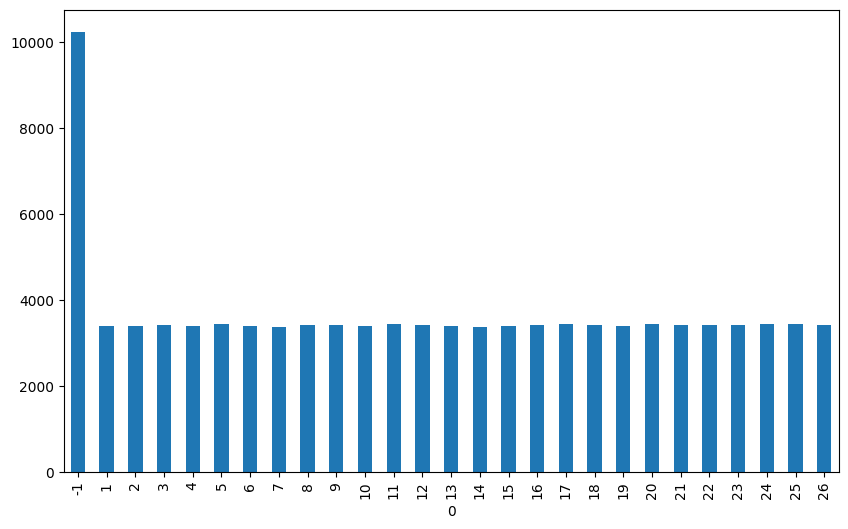

0
-1     10240
 1      3396
 2      3396
 3      3419
 4      3398
 5      3437
 6      3394
 7      3385
 8      3424
 9      3428
 10     3402
 11     3438
 12     3415
 13     3402
 14     3365
 15     3408
 16     3430
 17     3435
 18     3419
 19     3392
 20     3436
 21     3419
 22     3422
 23     3423
 24     3437
 25     3453
 26     3427
Name: count, dtype: int64


In [100]:
# Show how many of each there are
id_counts = withIdentifyingColumn[0].value_counts()
id_counts = id_counts.sort_index()
id_counts.plot(kind='bar', figsize=(10,6))
plt.show()
print(id_counts)
# Observation: There seems to be one called -1, that has more values compared to everything else. The rest of the values seem to be somewhat similar

In [101]:
# Trying to use image averaging in order to check the average image of -1, to see whether it is relevant to the images
justNegativeOne = withIdentifyingColumn.loc[withIdentifyingColumn[0] == -1]
print(justNegativeOne)
# Remove the identifying column
justNegativeOne = justNegativeOne.drop(columns=[0])
print(justNegativeOne)
justNegativeOne = pd.DataFrame(justNegativeOne)

       0    1    2    3    4    5    6    7    8    9    ...  775  776  777  \
20      -1   89   89   89   89   89   89   89   89   89  ...   89   89   89   
30      -1  216  216  216  216  216  216  216  216  216  ...  216  216  216   
31      -1   74   74   74   74   74   74   74   74   74  ...   74   74   74   
36      -1  148  148  148  148  148  148  148  148  148  ...  148  148  148   
39      -1  103  103  103  103  103  103  103  103  103  ...  103  103  103   
...    ...  ...  ...  ...  ...  ...  ...  ...  ...  ...  ...  ...  ...  ...   
99020   -1  205  205  205  205  205  205  205  205  205  ...  205  205  205   
99023   -1  153  153  153  153  153  153  153  153  153  ...  153  153  153   
99034   -1  132  132  132  132  132  132  132  132  132  ...  132  132  132   
99038   -1  174  174  174  174  174  174  174  174  174  ...  174  174  174   
99039   -1   42   42   42   42   42   42   42   42   42  ...   42   42   42   

       778  779  780  781  782  783  784  
20      

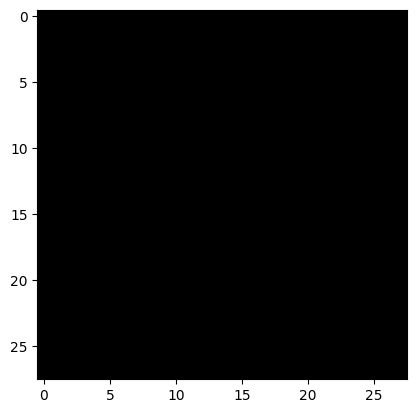

In [102]:
# average image 
images = []
for index, row in justNegativeOne.iterrows():
    image = np.array(row).astype('uint8').reshape(28,28)
    images.append(image)

average_image = np.mean(images, axis=0)

plt.imshow(average_image, cmap='gray')

# Observation: average_image doesn't have any letter on it, hence it is irrelevant to making the alphabets 

   0    1    2    3    4    5    6    7    8    9    ...  775  776  777  778  \
0   23    0    0    0    0    0    0    0    0    0  ...    0    0    0    0   
1    7    0    0    0    0    0    0    0    0    0  ...    0    0    0    0   
2   16    0    0    0    0    0    0    0    0    0  ...    0    0    0    0   
3   15    0    0    0    0    0    0    0    0    0  ...    0    0    0    0   
4   23    0    0    0    0    0    0    0    0    0  ...    0    0    0    0   
5   17    0    0    0    0    0    0    0    0    0  ...    0    0    0    0   
6   13    0    0    0    0    0    0    0    0    0  ...    0    0    0    0   
7   11    0    0    0    0    0    0    0    0    0  ...    0    0    0    0   
8   22    0    0    0    0    0    0    0    0    0  ...    0    0    0    0   
9   24    0    0    0    0    0    0    0    0    0  ...    0    0    0    0   

   779  780  781  782  783  784  
0    0    0    0    0    0    0  
1    0    0    0    0    0    0  
2    0    0    0 

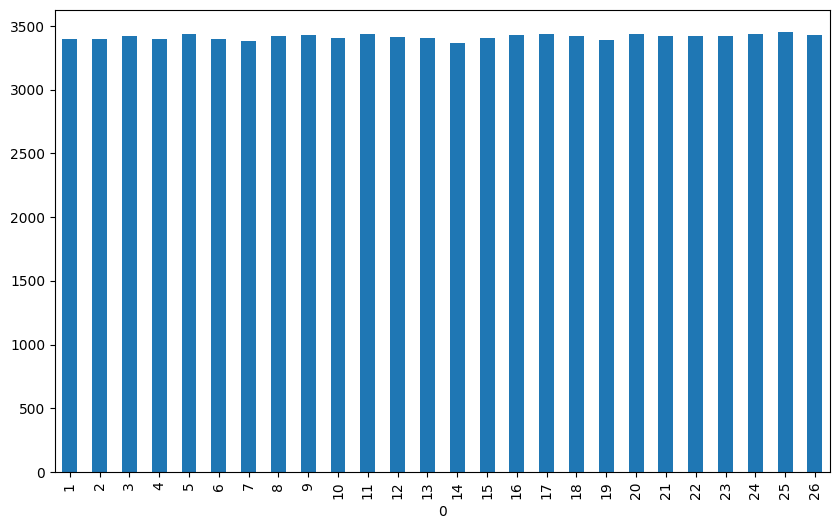

0
1     3396
2     3396
3     3419
4     3398
5     3437
6     3394
7     3385
8     3424
9     3428
10    3402
11    3438
12    3415
13    3402
14    3365
15    3408
16    3430
17    3435
18    3419
19    3392
20    3436
21    3419
22    3422
23    3423
24    3437
25    3453
26    3427
Name: count, dtype: int64
(88800, 785)


In [128]:
noNegativeOne = withIdentifyingColumn[withIdentifyingColumn[0] != -1]
print(noNegativeOne.head(10))
id_counts2 = noNegativeOne[0].value_counts()
id_counts2 = id_counts2.sort_index()
id_counts2.plot(kind='bar', figsize=(10,6))
plt.show()
print(id_counts2)
print(noNegativeOne.shape)
# the -1 has been removed properly

(88800, 784)


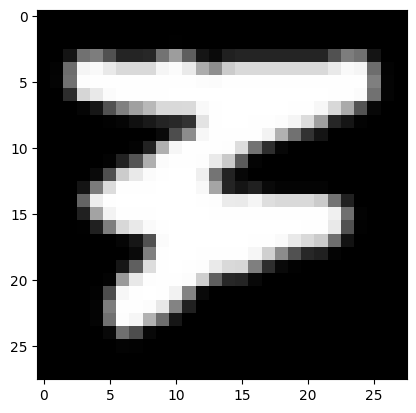

In [129]:
values = noNegativeOne.drop(columns=[0])
print(values.shape)
# Single exmaple on whether it worked or not
plt.imshow(values.iloc[0].values.reshape(28,28), cmap="gray")
plt.show()
# picture needs to be flipped and turned clockwise once

In [107]:
# processed_images = []
# identifiers = []

# for index, row in noNegativeOne.iterrows():
#     # Extract data
#     identifier = row.iloc[0]  # Identifier
#     image_data = np.array(row.iloc[1:], dtype=np.uint8).reshape(28, 28)  # 28x28 image

#     # Rotate the image 90 degrees clockwise
#     rotated_image = np.rot90(image_data, k=-1)

#     # Flip the image horizontally
#     flipped_image = np.flip(rotated_image, axis=1)

#     # Flatten the image data back to 1D
#     flattened_image = flipped_image.flatten()

#     # Store image and identifier in the lists made before
#     processed_images.append(flattened_image)
#     identifiers.append(identifier)

# # Convert data into a DataFrame
# processed_df = pd.DataFrame(processed_images)
# processed_df.insert(0, 'Identifier', identifiers)  # Insert identifier at the beginning

# # Save data as CSV
# output_csv_file = 'images.csv'  # New CSV file to store images
# processed_df.to_csv(output_csv_file, index=False)

# print(f'Saved processed images to {output_csv_file}')

Saved processed images to images.csv


In [5]:
df = pd.read_csv('./images.csv')

In [151]:
# # Creating the folder
# output_folder = 'images'
# os.makedirs(output_folder, exist_ok=True)

# for index, row in df.iterrows():
#     # Extract identifier and image data
#     identifier = row.iloc[0]  # Identifier
#     image_data = row.iloc[1:]  # Image

#     # If folder doesn't exist, make it
#     identifier_folder = os.path.join(output_folder, str(identifier))
#     os.makedirs(identifier_folder, exist_ok=True)

#     # 1D to 2D
#     image_array = np.array(image_data, dtype=np.uint8).reshape(28, 28)

#     # Creating the image
#     image = Image.fromarray(image_array)
    
#     # Save image
#     image_path = os.path.join(identifier_folder, f'image_{index}.png')
#     image.save(image_path)

#     print(f'Saved image {index} to {image_path}')

In [5]:
# Spilting it into values and labels
values = df.drop(columns='Identifier')
labels = df.iloc[:, 0:1]

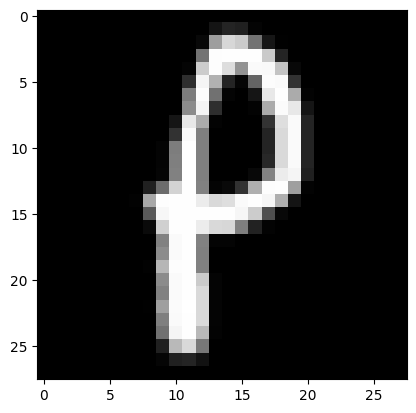

In [126]:
# Checking whether it works
plt.imshow(values.iloc[2].values.reshape(28,28), cmap="gray")

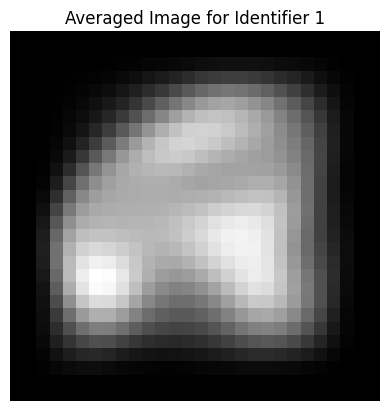

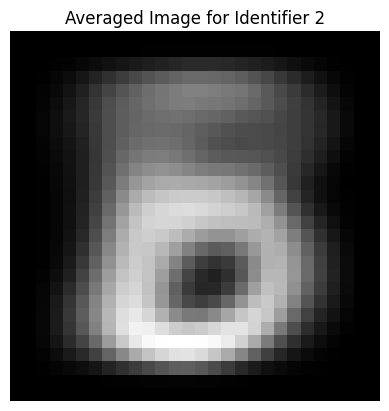

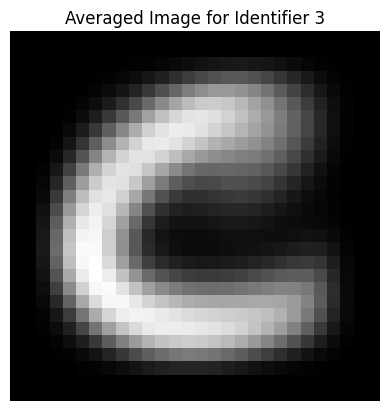

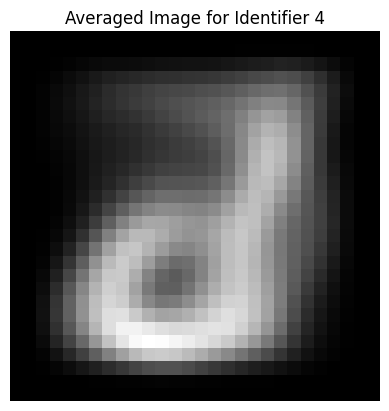

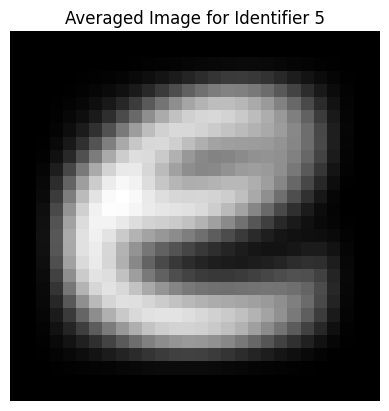

...

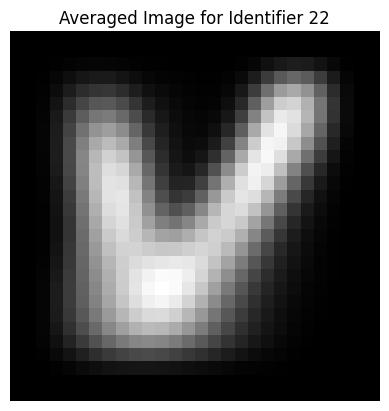

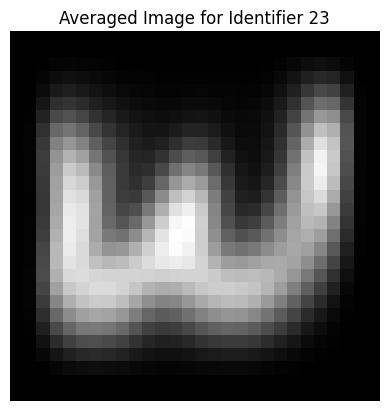

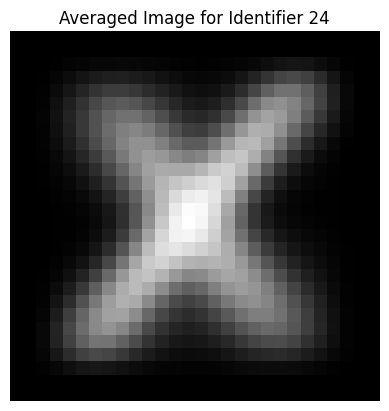

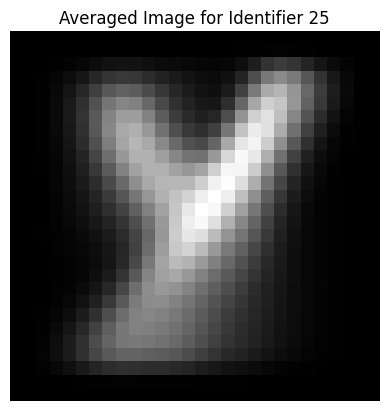

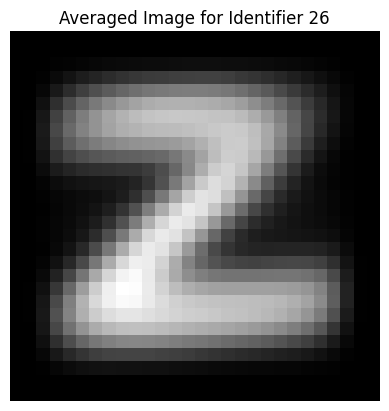

In [12]:
# Group by identifier and calculate average image
grouped = df.groupby('Identifier')

# Iterate through each group
for identifier, group in grouped:
    # Extract pixel values (assuming pixel columns start from column 1)
    images = group.iloc[:, 1:].values.astype(np.uint8)

    # Calculate average pixel value across all images
    average_image = np.mean(images, axis=0)

    # Reshape averaged image to 28x28 array
    average_image = average_image.reshape(28, 28)

    # Display averaged image using Matplotlib
    plt.figure()
    plt.imshow(average_image, cmap='gray')  # Assuming grayscale images
    plt.title(f'Averaged Image for Identifier {identifier}')
    plt.axis('off')  # Hide axes
    plt.show()

# mixture of uppercase and lowercase letters found for most letters. may have to do future changes where big and small letters are catergorised as such
# vague shape of each letter can be found

In [6]:
# # Identify unique identifiers
# identifiers = df['Identifier'].unique()

# # Loop through each unique identifier
# for identifier in identifiers:
#     # Filter the data based on the identifier
#     filtered_data = df[df['Identifier'] == identifier]
    
#     # Create a filename using the identifier
#     filename = f'{identifier}.csv'
    
#     # Save the filtered data to a separate CSV file
#     filtered_data.to_csv(filename, index=False)

# print("Data has been separated into individual CSV files based on identifiers.")

Data has been separated into individual CSV files based on identifiers.


In [8]:
# # Specify the folder containing the CSV files
# folder_path = './letters'

# # List all CSV files in the folder
# csv_files = [f for f in os.listdir(folder_path) if f.endswith('.csv')]

# # Loop through each CSV file
# for csv_file in csv_files:
#     # Construct the full file path
#     file_path = os.path.join(folder_path, csv_file)
    
#     # Read the CSV file
#     df = pd.read_csv(file_path)
    
#     # Remove the first column
#     df = df.iloc[:, 1:]
    
#     # Save the modified data back to the same CSV file
#     df.to_csv(file_path, index=False)

# print("First column removed from all CSV files in the folder.")

First column removed from all CSV files in the folder.


(3396, 784)
C:\Users\tiany\Anaconda3\envs\gpu_env\Library\share\tessdata


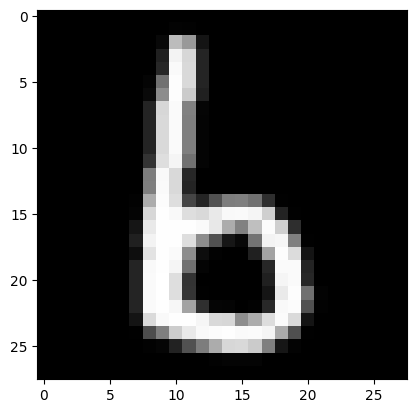

In [13]:
# # This is for the situation in which you want to generate a captial letter, or a specific class of letters.
# # Go ask cher ltr whether using teer something is ok or not
# # Load your CSV file
# df = pd.read_csv('./letters/2.csv')
# print(df.shape)
# # Set TESSDATA_PREFIX environment variable
# os.environ['TESSDATA_PREFIX'] = r'C:\Users\tiany\Anaconda3\envs\gpu_env\Library\share\tessdata'
# print(os.environ['TESSDATA_PREFIX'])
# # Function to convert flattened image to PIL Image
# def array_to_image(image_array):
#     return Image.fromarray(image_array.reshape(28, 28).astype(np.uint8))

# # Create empty lists for uppercase and lowercase
# uppercase_images = []
# lowercase_images = []

# # Loop through each image in the dataframe
# for index, row in df.iterrows():
#     image_array = row.values
#     image = array_to_image(image_array)
#     text = pytesseract.image_to_string(image, config='--psm 10')
#     if 'B' in text:
#         uppercase_images.append(row)
#     elif 'b' in text:
#         lowercase_images.append(row)

# # Create new dataframes for uppercase and lowercase
# uppercase_B = pd.DataFrame(uppercase_images, columns=df.columns)
# lowercase_B = pd.DataFrame(lowercase_images, columns=df.columns)

# # Save the separated data into new CSV files
# uppercase_B.to_csv('uppercase_B.csv', index=False)
# lowercase_B.to_csv('lowercase_B.csv', index=False)

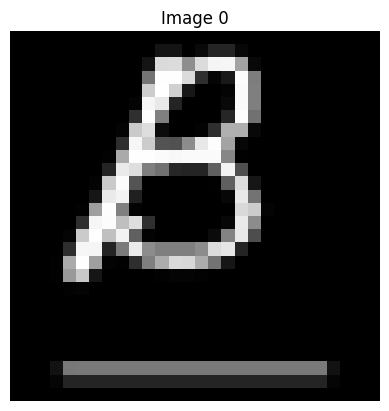

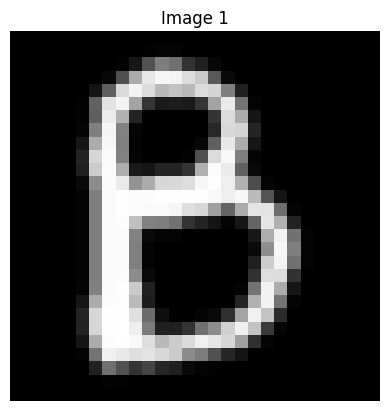

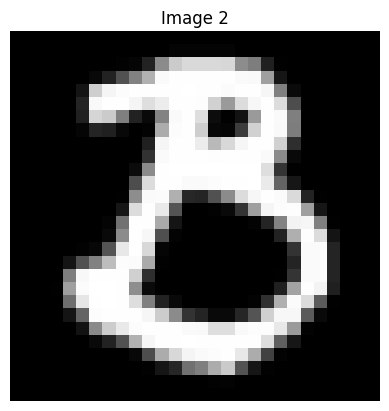

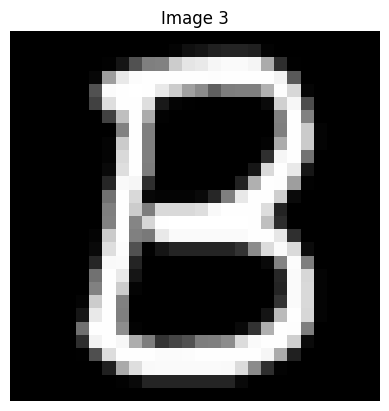

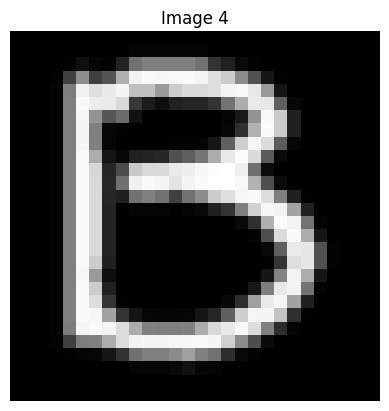

...

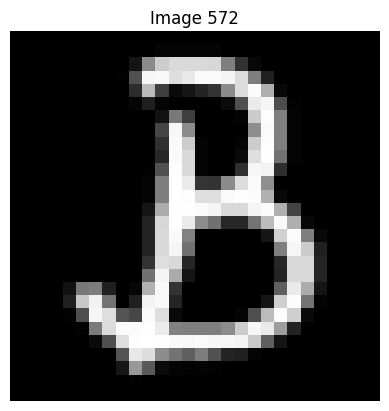

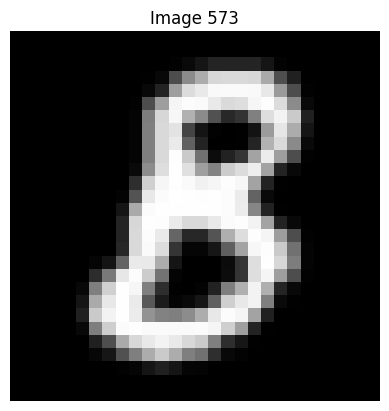

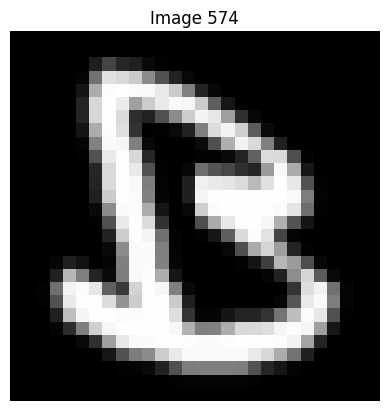

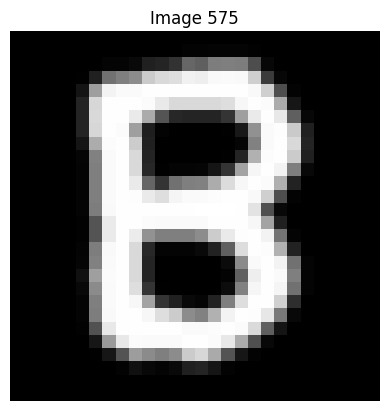

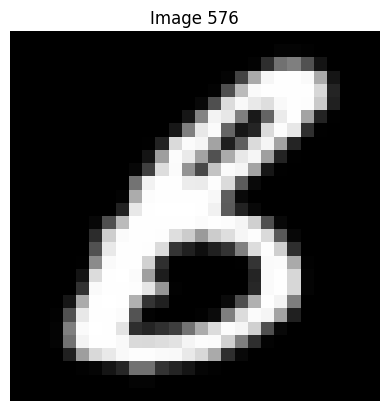

In [15]:
# Load your CSV file
df = pd.read_csv('./uppercase_B.csv')

# Function to convert flattened image to 2D array
def array_to_image(image_array):
    return image_array.reshape(28, 28).astype(np.uint8)

# Loop through each image in the dataframe and display it
for index, row in df.iterrows():
    image_array = row.values
    image = array_to_image(image_array)
    
    plt.imshow(image, cmap='gray')
    plt.title(f"Image {index}")
    plt.axis('off')
    plt.show()

In [167]:
class DCGAN:
    
    def build_generator(self):
        model = Sequential(name='Generator')
        model.add(Dense(128 * 7 * 7, activation="relu", input_dim=self.latent_dim))
        model.add(Reshape((7, 7, 128)))
        model.add(Conv2DTranspose(128, (4, 4), strides=(2, 2), padding='same'))
        model.add(LeakyReLU(alpha=0.2))
        model.add(Conv2DTranspose(128, (4, 4), strides=(2, 2), padding='same'))
        model.add(LeakyReLU(alpha=0.2))
        model.add(Conv2D(self.channels, kernel_size=7, padding="same", activation='sigmoid'))
        model.summary()
        noise = Input(shape=(self.latent_dim,))
        img = model(noise)
        return Model(noise, img)
    
    def build_discriminator(self):
        model = Sequential(name='Discriminator')
        model.add(Conv2D(128, kernel_size=3, strides=2, input_shape=self.img_shape, padding="same"))
        model.add(LeakyReLU(alpha=0.2))
        model.add(Dropout(0.4))
        model.add(Conv2D(128, kernel_size=3, strides=2, padding="same"))
        model.add(LeakyReLU(alpha=0.2))
        model.add(Dropout(0.4))
        model.add(Flatten())
        model.add(Dense(1, activation='sigmoid'))
        model.summary()
        img = Input(shape=self.img_shape)
        validity = model(img)
        return Model(img, validity)

    def __init__(self, rows, cols, channels, z=100):
        self.img_rows = rows
        self.img_cols = cols
        self.channels = channels
        self.img_shape = (self.img_rows, self.img_cols, self.channels)
        self.latent_dim = z
        optimizer = Adam(learning_rate=0.0002, beta_1=0.5)
        self.discriminator = self.build_discriminator()
        self.discriminator.compile(loss='binary_crossentropy', optimizer=optimizer, metrics=['accuracy'])
        self.generator = self.build_generator()
        z = Input(shape=(self.latent_dim,))
        img = self.generator(z)
        self.discriminator.trainable = False
        valid = self.discriminator(img)
        self.combined = Model(z, valid)
        self.combined.compile(loss='binary_crossentropy', optimizer=optimizer)
    
    def train(self, df_array, epochs, batch_size=128, save_interval=50):
        # Separate the identifier column from image data
        identifiers = df_array[:, 0]
        X_train = df_array[:, 1:].astype(np.float32)
        
        print("Shape of X_train before reshaping:", X_train.shape)
        
        # Ensure the number of elements matches
        if X_train.shape[1] != self.img_rows * self.img_cols * self.channels:
            raise ValueError(f"Expected {self.img_rows * self.img_cols * self.channels} elements per image, but got {X_train.shape[1]}")
        
        X_train = X_train.reshape(X_train.shape[0], self.img_rows, self.img_cols, self.channels)
        X_train = X_train / 255.0
        
        print("Shape of X_train after reshaping:", X_train.shape)
        
        # Adversarial ground truths
        valid = np.ones((batch_size, 1))
        fake = np.zeros((batch_size, 1))
        
        for epoch in range(epochs):
            # ---------------------
            # Train Discriminator
            # ---------------------
            # Select a random half of images
            idx = np.random.randint(0, X_train.shape[0], batch_size)
            imgs = X_train[idx]
            
            # Sample noise and generate a batch of new images
            noise = np.random.normal(0, 1, (batch_size, self.latent_dim))
            gen_imgs = self.generator.predict(noise)
            
            # Train the discriminator (classify real images as 1 and generated images as 0)
            d_loss_real = self.discriminator.train_on_batch(imgs, valid)
            d_loss_fake = self.discriminator.train_on_batch(gen_imgs, fake)
            d_loss = 0.5 * np.add(d_loss_real, d_loss_fake)
            
            # -----------------
            # Train Generator
            # -----------------
            noise = np.random.normal(0, 1, (batch_size, self.latent_dim))
            
            # Train the generator (generator wants discriminator to predict generated images as 1)
            g_loss = self.combined.train_on_batch(noise, valid)
            
            # Plot the progress
            print ("%d [D loss: %f, acc.: %.2f%%] [G loss: %f]" % (epoch, d_loss[0], 100*d_loss[1], g_loss))
            
            # If at save interval => save generated image samples
            if epoch % save_interval == 0:
                self.save_imgs(epoch)
    
    def save_imgs(self, epoch):
        r, c = 5, 5
        noise = np.random.normal(0, 1, (r * c, self.latent_dim))
        gen_imgs = self.generator.predict(noise)
        fig, axs = plt.subplots(r, c)
        cnt = 0
        for i in range(r):
            for j in range(c):
                axs[i, j].imshow(gen_imgs[cnt, :, :, 0], cmap='gray')
                axs[i, j].axis('off')
                cnt += 1
        os.makedirs('generated_images', exist_ok=True)
        fig.savefig("generated_images/dcgan_mnist_{:d}.png".format(epoch))
        plt.close()
    
    def generate_imgs_for_identifiers(self, identifiers):
        for identifier in np.unique(identifiers):
            noise = np.random.normal(0, 1, (1, self.latent_dim))
            gen_img = self.generator.predict(noise)
            plt.imshow(gen_img[0, :, :, 0], cmap='gray')
            plt.axis('off')
            os.makedirs('generated_images_by_identifier', exist_ok=True)
            plt.savefig(f"generated_images_by_identifier/{identifier}.png")
            plt.close()

df_array = np.array(df)

# Initialize and train the DCGAN
dcgan = DCGAN(28, 28, 1)
dcgan.train(df_array, epochs=5000, batch_size=256, save_interval=50)

# Generate images for each unique identifier
dcgan.generate_imgs_for_identifiers(df_array[:, 0])


Model: "Discriminator"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_33 (Conv2D)          (None, 14, 14, 128)       1280      
                                                                 
 leaky_re_lu_44 (LeakyReLU)  (None, 14, 14, 128)       0         
                                                                 
 dropout_22 (Dropout)        (None, 14, 14, 128)       0         
                                                                 
 conv2d_34 (Conv2D)          (None, 7, 7, 128)         147584    
                                                                 
 leaky_re_lu_45 (LeakyReLU)  (None, 7, 7, 128)         0         
                                                                 
 dropout_23 (Dropout)        (None, 7, 7, 128)         0         
                                                                 
 flatten_11 (Flatten)        (None, 6272)            

In [24]:
import pandas as pd
import numpy as np
import tensorflow as tf
from tensorflow.keras.models import Sequential, Model
from tensorflow.keras.layers import Dense, Reshape, Flatten, Conv2D, Conv2DTranspose, LeakyReLU
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import ModelCheckpoint
from kerastuner.tuners import RandomSearch

# Load dataset
df = pd.read_csv('images.csv')

# Assuming 'identifier' is the column name for identifier and 'image' for flattened image data
identifier_col = 'identifier'
image_col = 'image'
# Spilting it into values and labels
values = df.drop(columns='Identifier')
labels = df.iloc[:, 0:1]

# Assuming each row has 784 columns representing flattened 28x28 images
x_train = df[image_col].values.reshape(-1, 28, 28, 1)
y_train = df[identifier_col].values.reshape(-1, 1)

# Generator model
def build_generator():
    model = Sequential([
        Dense(7*7*128, input_shape=(100,), activation='relu'),
        Reshape((7, 7, 128)),
        Conv2DTranspose(64, (3, 3), strides=(2, 2), padding='same', activation='relu'),
        Conv2DTranspose(1, (3, 3), strides=(2, 2), padding='same', activation='sigmoid')  # Output should match image dimensions
    ])
    return model

# Discriminator model
def build_discriminator():
    model = Sequential([
        Conv2D(64, (3, 3), strides=(2, 2), padding='same', input_shape=(28, 28, 1), activation=LeakyReLU(alpha=0.2)),
        Conv2D(128, (3, 3), strides=(2, 2), padding='same', activation=LeakyReLU(alpha=0.2)),
        Flatten(),
        Dense(1, activation='sigmoid')
    ])
    return model

# GAN model
def build_gan(generator, discriminator):
    discriminator.trainable = False
    gan_input = tf.keras.Input(shape=(100,))
    x = generator(gan_input)
    gan_output = discriminator(x)
    gan = Model(gan_input, gan_output)
    return gan

# Hyperparameter tuning with Keras Tuner
def build_model(hp):
    generator = build_generator()
    discriminator = build_discriminator()
    
    discriminator.compile(optimizer=Adam(hp.Choice('learning_rate', [1e-2, 1e-3, 1e-4])), loss='binary_crossentropy', metrics=['accuracy'])
    
    gan = build_gan(generator, discriminator)
    gan.compile(optimizer=Adam(hp.Choice('learning_rate', [1e-2, 1e-3, 1e-4])), loss='binary_crossentropy')
    
    return gan

# Keras Tuner setup
tuner = RandomSearch(
    build_model,
    objective='val_loss',
    max_trials=5,
    executions_per_trial=3,
    directory='keras_tuner_logs'
)

# Perform hyperparameter search
tuner.search(x=x_train, y=y_train, epochs=10, validation_split=0.1)

# Retrieve best model and summary
best_model = tuner.get_best_models(num_models=1)[0]
best_model.summary()

# Training with model checkpointing
checkpoint_callback = ModelCheckpoint('dcgan_checkpoint.h5', monitor='val_loss', save_best_only=True, mode='min')

# Train the best model
best_model.fit(x_train, y_train, epochs=10, batch_size=32, validation_split=0.1, callbacks=[checkpoint_callback])


Reloading Tuner from keras_tuner_logs\untitled_project\tuner0.json

Search: Running Trial #3

Value             |Best Value So Far |Hyperparameter
0.001             |0.01              |learning_rate



Traceback (most recent call last):
  File "C:\Users\tiany\anaconda3\envs\gpu_env\lib\site-packages\keras_tuner\src\engine\base_tuner.py", line 274, in _try_run_and_update_trial
    self._run_and_update_trial(trial, *fit_args, **fit_kwargs)
  File "C:\Users\tiany\anaconda3\envs\gpu_env\lib\site-packages\keras_tuner\src\engine\base_tuner.py", line 239, in _run_and_update_trial
    results = self.run_trial(trial, *fit_args, **fit_kwargs)
  File "C:\Users\tiany\anaconda3\envs\gpu_env\lib\site-packages\keras_tuner\src\engine\tuner.py", line 314, in run_trial
    obj_value = self._build_and_fit_model(trial, *args, **copied_kwargs)
  File "C:\Users\tiany\anaconda3\envs\gpu_env\lib\site-packages\keras_tuner\src\engine\tuner.py", line 232, in _build_and_fit_model
    model = self._try_build(hp)
  File "C:\Users\tiany\anaconda3\envs\gpu_env\lib\site-packages\keras_tuner\src\engine\tuner.py", line 164, in _try_build
    model = self._build_hypermodel(hp)
  File "C:\Users\tiany\anaconda3\envs\gpu_

RuntimeError: Number of consecutive failures exceeded the limit of 3.
Traceback (most recent call last):
  File "C:\Users\tiany\anaconda3\envs\gpu_env\lib\site-packages\keras_tuner\src\engine\base_tuner.py", line 274, in _try_run_and_update_trial
    self._run_and_update_trial(trial, *fit_args, **fit_kwargs)
  File "C:\Users\tiany\anaconda3\envs\gpu_env\lib\site-packages\keras_tuner\src\engine\base_tuner.py", line 239, in _run_and_update_trial
    results = self.run_trial(trial, *fit_args, **fit_kwargs)
  File "C:\Users\tiany\anaconda3\envs\gpu_env\lib\site-packages\keras_tuner\src\engine\tuner.py", line 314, in run_trial
    obj_value = self._build_and_fit_model(trial, *args, **copied_kwargs)
  File "C:\Users\tiany\anaconda3\envs\gpu_env\lib\site-packages\keras_tuner\src\engine\tuner.py", line 232, in _build_and_fit_model
    model = self._try_build(hp)
  File "C:\Users\tiany\anaconda3\envs\gpu_env\lib\site-packages\keras_tuner\src\engine\tuner.py", line 164, in _try_build
    model = self._build_hypermodel(hp)
  File "C:\Users\tiany\anaconda3\envs\gpu_env\lib\site-packages\keras_tuner\src\engine\tuner.py", line 155, in _build_hypermodel
    model = self.hypermodel.build(hp)
  File "C:\Users\tiany\AppData\Local\Temp\ipykernel_18128\1560708301.py", line 44, in build_model
    generator = build_generator()
  File "C:\Users\tiany\AppData\Local\Temp\ipykernel_18128\1560708301.py", line 15, in build_generator
    model = Sequential([
  File "C:\Users\tiany\anaconda3\envs\gpu_env\lib\site-packages\tensorflow\python\trackable\base.py", line 205, in _method_wrapper
    result = method(self, *args, **kwargs)
  File "C:\Users\tiany\anaconda3\envs\gpu_env\lib\site-packages\keras\utils\traceback_utils.py", line 70, in error_handler
    raise e.with_traceback(filtered_tb) from None
  File "C:\Users\tiany\anaconda3\envs\gpu_env\lib\site-packages\keras\layers\reshaping\reshape.py", line 118, in _fix_unknown_dimension
    raise ValueError(msg)
ValueError: Exception encountered when calling layer "reshape" (type Reshape).

total size of new array must be unchanged, input_shape = [28, 28, 6272], output_shape = [7, 7, 128]

Call arguments received by layer "reshape" (type Reshape):
  • inputs=tf.Tensor(shape=(None, 28, 28, 6272), dtype=float32)


In [ ]:
# Define the standalone discriminator model
def define_discriminator(in_shape=(28,28,1)):
    model = Sequential()
    model.add(Conv2D(64, (3,3), padding='same', input_shape=in_shape))
    model.add(LeakyReLU(alpha=0.2))
    model.add(Conv2D(128, (3,3), strides=(2,2), padding='same'))
    model.add(LeakyReLU(alpha=0.2))
    model.add(Conv2D(128, (3,3), strides=(2,2), padding='same'))
    model.add(LeakyReLU(alpha=0.2))
    model.add(Conv2D(256, (3,3), strides=(2,2), padding='same'))
    model.add(LeakyReLU(alpha=0.2))
    model.add(Flatten())
    model.add(Dropout(0.4))
    model.add(Dense(1, activation='sigmoid'))
    opt = Adam(learning_rate=0.0002, beta_1=0.5)
    model.compile(loss='binary_crossentropy', optimizer=opt, metrics=['accuracy'])
    return model

# Define the standalone generator model
def define_generator(latent_dim):
    model = Sequential()
    n_nodes = 128 * 7 * 7
    model.add(Dense(n_nodes, input_dim=latent_dim))
    model.add(LeakyReLU(alpha=0.2))
    model.add(Reshape((7, 7, 128)))
    model.add(Conv2DTranspose(128, (4,4), strides=(2,2), padding='same'))
    model.add(LeakyReLU(alpha=0.2))
    model.add(Conv2DTranspose(128, (4,4), strides=(2,2), padding='same'))
    model.add(LeakyReLU(alpha=0.2))
    model.add(Conv2D(1, (3,3), activation='tanh', padding='same'))
    return model

# Define the combined generator and discriminator model, for updating the generator
def define_gan(g_model, d_model):
    d_model.trainable = False
    model = Sequential()
    model.add(g_model)
    model.add(d_model)
    opt = Adam(learning_rate=0.0002, beta_1=0.5)
    model.compile(loss='binary_crossentropy', optimizer=opt)
    return model

# Load and prepare training images
def load_real_samples(df, img_height=28, img_width=28):
    trainX = df.iloc[:, 1:].values.reshape(-1, img_height, img_width, 1)
    X = trainX.astype('float32') / 255.0
    return X

# Select real samples
def generate_real_samples(dataset, n_samples):
    ix = randint(0, dataset.shape[0], n_samples)
    X = dataset[ix]
    y = np.ones((n_samples, 1))
    return X, y

# Generate points in latent space as input for the generator
def generate_latent_points(latent_dim, n_samples):
    x_input = randn(latent_dim * n_samples)
    x_input = x_input.reshape(n_samples, latent_dim)
    return x_input

# Use the generator to generate n fake examples, with class labels
def generate_fake_samples(g_model, latent_dim, n_samples):
    x_input = generate_latent_points(latent_dim, n_samples)
    X = g_model.predict(x_input)
    y = np.zeros((n_samples, 1))
    return X, y

# Create and save a plot of generated images
def save_plot(examples, epoch, n=7, save_dir='generated_images'):
    if not os.path.exists(save_dir):
        os.makedirs(save_dir)
    examples = (examples + 1) / 2.0
    for i in range(n * n):
        plt.subplot(n, n, 1 + i)
        plt.axis('off')
        plt.imshow(examples[i])
    filename = os.path.join(save_dir, 'generated_plot_e%03d.png' % (epoch+1))
    plt.savefig(filename)
    plt.close()

# Custom callback to summarize performance and save models
class GANMonitor(Callback):
    def __init__(self, g_model, d_model, latent_dim, dataset, save_interval=100, n_samples=150, save_dir='generated_images'):
        self.g_model = g_model
        self.d_model = d_model
        self.latent_dim = latent_dim
        self.dataset = dataset
        self.save_interval = save_interval
        self.n_samples = n_samples
        self.save_dir = save_dir
        if not os.path.exists(save_dir):
            os.makedirs(save_dir)

    def on_epoch_end(self, epoch, logs=None):
        if (epoch + 1) % self.save_interval == 0:
            X_real, y_real = generate_real_samples(self.dataset, self.n_samples)
            _, acc_real = self.d_model.evaluate(X_real, y_real, verbose=0)
            x_fake, y_fake = generate_fake_samples(self.g_model, self.latent_dim, self.n_samples)
            _, acc_fake = self.d_model.evaluate(x_fake, y_fake, verbose=0)
            print('>Accuracy real: %.0f%%, fake: %.0f%%' % (acc_real*100, acc_fake*100))
            self.save_plot(x_fake, epoch)
            filename = os.path.join(self.save_dir, 'generator_model_%03d.h5' % (epoch+1))
            self.g_model.save(filename)

    def save_plot(self, examples, epoch, n=7):
        examples = (examples + 1) / 2.0
        for i in range(n * n):
            plt.subplot(n, n, 1 + i)
            plt.axis('off')
            plt.imshow(examples[i])
        filename = os.path.join(self.save_dir, 'generated_plot_e%03d.png' % (epoch+1))
        plt.savefig(filename)
        plt.close()

# Train the generator and discriminator
def train(g_model, d_model, gan_model, dataset, latent_dim, n_epochs=200, n_batch=128):
    bat_per_epo = int(dataset.shape[0] / n_batch)
    half_batch = int(n_batch / 2)
    gan_monitor = GANMonitor(g_model, d_model, latent_dim, dataset)

    for i in range(n_epochs):
        for j in range(bat_per_epo):
            X_real, y_real = generate_real_samples(dataset, half_batch)
            d_loss1, _ = d_model.train_on_batch(X_real, y_real)
            X_fake, y_fake = generate_fake_samples(g_model, latent_dim, half_batch)
            d_loss2, _ = d_model.train_on_batch(X_fake, y_fake)
            X_gan = generate_latent_points(latent_dim, n_batch)
            y_gan = np.ones((n_batch, 1))
            g_loss = gan_model.train_on_batch(X_gan, y_gan)
            print('>%d, %d/%d, d1=%.3f, d2=%.3f g=%.3f' % (i+1, j+1, bat_per_epo, d_loss1, d_loss2, g_loss))
        
        # Call the callback at the end of each epoch
        gan_monitor.on_epoch_end(i)

# Size of the latent space
latent_dim = 100
# Create the discriminator
d_model = define_discriminator()
# Create the generator
g_model = define_generator(latent_dim)
# Create the GAN
gan_model = define_gan(g_model, d_model)
# Load image data
df = pd.read_csv('images.csv')
dataset = load_real_samples(df)
# Train model
train(g_model, d_model, gan_model, dataset, latent_dim)


2/2 [==============================] - 0s 4ms/step
>1, 1/693, d1=0.689, d2=0.696 g=0.691
2/2 [==============================] - 0s 3ms/step
>1, 2/693, d1=0.661, d2=0.701 g=0.686
2/2 [==============================] - 0s 4ms/step
>1, 3/693, d1=0.633, d2=0.712 g=0.677
2/2 [==============================] - 0s 4ms/step
>1, 4/693, d1=0.595, d2=0.732 g=0.661
2/2 [==============================] - 0s 4ms/step
>1, 5/693, d1=0.561, d2=0.765 g=0.641
2/2 [==============================] - 0s 5ms/step
>1, 6/693, d1=0.525, d2=0.800 g=0.624
2/2 [==============================] - 0s 4ms/step
>1, 7/693, d1=0.506, d2=0.818 g=0.624
2/2 [==============================] - 0s 4ms/step
>1, 8/693, d1=0.498, d2=0.804 g=0.644
2/2 [==============================] - 0s 5ms/step
>1, 9/693, d1=0.495, d2=0.761 g=0.697
2/2 [==============================] - 0s 4ms/step
>1, 10/693, d1=0.486, d2=0.701 g=0.778
2/2 [==============================] - 0s 4ms/step
>1, 11/693, d1=0.467, d2=0.629 g=0.855
2/2 [==============

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



2/2 [==============================] - 0s 7ms/step
>68, 65/693, d1=0.143, d2=0.015 g=5.608
2/2 [==============================] - 0s 7ms/step
>68, 66/693, d1=0.256, d2=0.239 g=4.387
2/2 [==============================] - 0s 6ms/step
>68, 67/693, d1=0.283, d2=0.006 g=5.726
2/2 [==============================] - 0s 7ms/step
>68, 68/693, d1=0.051, d2=0.110 g=4.032
2/2 [==============================] - 0s 6ms/step
>68, 69/693, d1=0.033, d2=0.046 g=5.216
2/2 [==============================] - 0s 6ms/step
>68, 70/693, d1=0.017, d2=0.012 g=5.878
2/2 [==============================] - 0s 8ms/step
>68, 71/693, d1=0.304, d2=0.064 g=2.933
2/2 [==============================] - 0s 6ms/step
>68, 72/693, d1=0.013, d2=0.425 g=5.094
2/2 [==============================] - 0s 7ms/step
>68, 73/693, d1=0.279, d2=0.005 g=5.856
2/2 [==============================] - 0s 6ms/step
>68, 74/693, d1=0.213, d2=0.052 g=4.209
2/2 [==============================] - 0s 7ms/step
>68, 75/693, d1=0.044, d2=0.085 g=4.366

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



>72, 571/693, d1=0.192, d2=0.089 g=3.702
2/2 [==============================] - 0s 7ms/step
>72, 572/693, d1=0.251, d2=0.148 g=3.229
2/2 [==============================] - 0s 7ms/step
>72, 573/693, d1=0.127, d2=0.084 g=3.780
2/2 [==============================] - 0s 6ms/step
>72, 574/693, d1=0.209, d2=0.050 g=3.981
2/2 [==============================] - 0s 7ms/step
>72, 575/693, d1=0.082, d2=0.094 g=3.383
2/2 [==============================] - 0s 6ms/step
>72, 576/693, d1=0.132, d2=0.049 g=3.859
2/2 [==============================] - 0s 6ms/step
>72, 577/693, d1=0.064, d2=0.068 g=3.933
2/2 [==============================] - 0s 7ms/step
>72, 578/693, d1=0.298, d2=0.199 g=3.411
2/2 [==============================] - 0s 6ms/step
>72, 579/693, d1=0.140, d2=0.115 g=3.784
2/2 [==============================] - 0s 7ms/step
>72, 580/693, d1=0.141, d2=0.052 g=4.196
2/2 [==============================] - 0s 5ms/step
>72, 581/693, d1=0.161, d2=0.120 g=3.632
2/2 [==============================] - 